# CAB420 DCNNs, Bonus Example: GANs
Dr Simon Denman (s.denman@qut.edu.au)

### What is a "Bonus" Example?

These are extra examples that cover content outside the scope of CAB420. It exists becuase of one or more of the following reasons:
* It's closely related to other stuff we're looking at and I wanted to include it, but the course has too much content already, so I punted it here; 
* It's interesting;
* Someone (probably multiple someones if I wrote an example) has asked a question about it before.

You can freely ignore this example if you want. You really don't have to be reading this. Things here won't appear on an exam, or in an assignment (though you could use this in an assignment if you wanted). But if you're interested, it's here. 

Some things to note with bonus examples:
* These may gloss over details that elsewhere get more coverage. I may skip plots I'd normally include, or glodd over other details. The expecatation is that if you're reading this, you've looked at all the "core" examples and are comfortable with what they're doing. 
* Some bits of code might not be as well explained or explored as you're used to in the other examples. These examples are here for interested students looking to extend their knowledge, and I'm assuming if you're here, you're comfortable figuring code out, debugging stuff, and generally googling about to help work out what something is doing.
* There's no Tl;DR section at the top. If you're here, I'm assuming it's because you're interested and want all the gory details.

That said, as always, if you are stuggling to follow what I've got in here please shoot me a message. The aim is still for this to be clear enough to follow afterall.

## Overview

GANs are cool. But GANs are also fiddly, and confusing, hence they live in "bonus" teritory. Once upon a time they were in the main course content - in hindsight that was a poor choice.

In this example we will start to explore Generative Adversarial Networks, more commonly known as GANs. GANs are able to synthesise (i.e. make up) data, and have become very popular in machine learning for tasks where content creation is needed, or where mappings between domains (i.e. depth from monocular vision) are required. In this example we'll look at a couple of GANs that will learn to create images of clothing - basically we're training a fashion designer.

This example has been adapted from a few sources, including [this tensorflow example](https://www.tensorflow.org/tutorials/generative/dcgan) and the excellent, though increasingly old and out-of-date, [Keras GAN](https://github.com/eriklindernoren/Keras-GAN). I will add there are tons of GAN examples out there. I'm not trying to create the most amazing thing possible here - rather I'm looking for something compact enough to play with and serve as a starting point.

### Challenges with GANs

Consider this bit the warning about GANs. As noted above, GANs are cool, but they are can be hard to train. The core of a GAN is this *Adversarial* part. We have two networks, the generator (G) and discriminator (D). These two networks take part in a two player game. The game is played as follows:
* G creates a fake sample, taking noise as the input
* D recieves a real sample, and a fake sample, and tries to tell them apart

G wins if it fools D. D wins if it picks the real and fake correctly. This means that G's aim is to create realisitic data, but it's not quite that simple. Both G and G are being continually trained, so as G learns to create something that fools D, D will get updated via gradient descent, thus improving it's ability to spot the fake; in turn forcing G to get better at forgery. The theory is that this continues on for ever and ever, or at least until you reach some maximum number of epochs, and with every passing batch of data through the pair of networks, the fakes get that little more realistic.

For this to work in practice, D and G need to be well balanced. If one is too powerful, it will dominate and training will fail. What we want is neither side to win, but them just to keep pushing each other to improve. Getting this balance right can be a pain and tricks you will resort to include:
* Having different learning rates (or optimisers) for D and G;
* Tweaking the respective size of each model;
* Training one more than the other to keep them in balance, i.e. do two training passes through G for each training pass across D; and/or
* Moving towards more complex versions of GANs to try and improve stability (wGANs for example).

### GANs and CAB420, and where they fit

Where does this fit? It's a deep net, so it kind of joins up to all that other stuff. We can think of the generator as being like a decoder (decode from noise to a sample), so it sort of fits with the other encoder-decoder architecture and certainly the enduring Pix2Pix method (which we're not looking at here) can be seen in this light. This is also a generative model, so has links to the other generative models we've looked at, VAEs and GMMs.

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf

import keras
import glob
import imageio
import matplotlib.pyplot as plt
import numpy as np
import PIL
from keras import layers
import time
import io

from IPython import display
from PIL import Image

tf.config.optimizer.set_jit(False)

## The Data

As we don't want this to take forever to run, we'll use Fashion MNIST, i.e. we'll teach our GAN to make clothes.

In [2]:
(train_images, train_labels), (_, _) = keras.datasets.fashion_mnist.load_data()
train_images = train_images.reshape(train_images.shape[0], 28, 28, 1).astype('float32')
# Normalize the images to [-1, 1]
train_images = (train_images - 127.5) / 127.5 
# push the data into a tf Dataset, note that we have no labels. GANs are said to be unsupervised as there are no
# labels needed, we simply need some example data to use as the "real" samples. There are ways to add supervision into
# a GAN however.
buffer_size = 60000
batch_size = 256
train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(buffer_size).batch(batch_size)

## The Networks
GANs contain two networks:
* The **Generator** (or G)
* The **Disrciminator** (or D)

For now, we'll just use dense layers and keep this very simple.

The **Generator** is responsible for taking noise (or some other stimulus) and creating a fake thing. We're training a standard GAN, which takes noise as an input and uses that as stimulus to create an image. As such, our input will be a noise vector. We'll just use a few dense layers to get enough neurons, and then reshape the output into an image shape.

The **Discriminator** is going to take in an image from either the actual dataset, or from the generator, and try tell the real ones from the take ones. This will have a single output, to which we can apply binary cross entropy to get our loss.

Keeping the two networks balanced so that one does not always win against the other is critical with a GAN. As such, we want both G and D to have similar levels of complexity (i.e. similar number of layers, layer sizes, etc). While we'll aim for the balance, the reality is that there is usually certain amount of trial and error when setting up a GAN and getting this right.  

In [3]:
# function to a simple fully connected generator network
#  - latent_dim: the number of the dimensions in the noise input
#  - img_shape: the target output image shape
def build_generator(latent_dim = 100, img_shape = (28, 28, 1)):

    # image input
    img = keras.Input(shape=(latent_dim,), name='img')

    # stacked dense layers, upsampling from the noise input
    x = layers.Dense(256, activation=None)(img)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.BatchNormalization(momentum=0.8)(x)
    x = layers.Dense(512, activation=None)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.BatchNormalization(momentum=0.8)(x)
    x = layers.Dense(1024, activation=None)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.BatchNormalization(momentum=0.8)(x)

    # dense layer to get the correct number of neurons for the image, note the 
    # tanh activation. Our inputs are [-1..+1], so our outputs should be too
    x = layers.Dense(img_shape[0]*img_shape[1]*img_shape[2], activation='tanh')(x)
    # reshape to get the image
    output = layers.Reshape(img_shape)(x)

    # return the model: noise as input, image as output
    return keras.Model(inputs=img, outputs=output, name='generator')

# function to build a simple fully connected discriminator network
#  - input_shape: shape of the input
def build_discriminator(input_shape = (28, 28, 1)):

    # image input
    img = keras.Input(shape=input_shape, name='img')

    # dense layers, gradually decreasing in size to a single output
    x = layers.Flatten()(img)
    x = layers.Dense(512, activation=None)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    x = layers.Dense(256, activation=None)(x)
    x = layers.LeakyReLU(alpha=0.2)(x)
    # binary output, indicating real/fake (1/0). Note that we have 
    # no activation here, so we'll use from_logits in our loss
    output = layers.Dense(1, activation=None)(x)

    # return the model, image as input, real/fake decision as output
    return keras.Model(inputs=img, outputs=output, name='discriminator')

# build the networks
generator = build_generator()
discriminator = build_discriminator()

# print the network summaries
generator.summary()
discriminator.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ img (InputLayer)                │ (None, 100)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense (Dense)                   │ (None, 256)               │     25,856 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 256)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization             │ (None, 256)               │      1,024 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_1 (Dense)                 │ (None, 512)               │    131,584 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 512)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_1           │ (None, 512)               │      2,048 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_2 (Dense)                 │ (None, 1024)              │    525,312 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 1024)              │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_2           │ (None, 1024)              │      4,096 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_3 (Dense)                 │ (None, 784)               │    803,600 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ reshape (Reshape)               │ (None, 28, 28, 1)         │          0 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 1,493,520 (5.70 MB)

 Trainable params: 1,489,936 (5.68 MB)

 Non-trainable params: 3,584 (14.00 KB)

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ img (InputLayer)                │ (None, 28, 28, 1)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ flatten (Flatten)               │ (None, 784)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_4 (Dense)                 │ (None, 512)               │    401,920 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 512)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_5 (Dense)                 │ (None, 256)               │    131,328 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 256)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_6 (Dense)                 │ (None, 1)                 │        257 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 533,505 (2.04 MB)

 Trainable params: 533,505 (2.04 MB)

 Non-trainable params: 0 (0.00 B)

Create some other bits and pieces that we'll need.

In [4]:
# create the optimisers. These may have different learning rates, or be totally different optimisers even.
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

# number of epochs to train for
num_epochs = 100
# size of the noise dimension
latent_dim = 100

# for image display. We'll create a grid of r x c images that we'll update after each epoch. We'll use the same
# set of random seeds every time to make changes in behaviour of the GAN easier to observe
r = 5
c = 5
num_examples_to_generate = r*c
seed = keras.random.normal([num_examples_to_generate, latent_dim])

## Setting All it Up

Now comes the code that might get a bit confusing. First up, let's consider how we'll train all this. We will:
* Create some noise
* Pass this noise through G, creating some fake samples
* Get some real samples
* Pass the fake samples and the real samples through D
* Measure how many of the fake and real samples D got wrong, this becomes the loss for D, and we update D.
* Measure how many of the fake samples D classified correctly, this becomes the loss for G (G is trying to fool D, so D getting something right is bad for G) and we update G.

There's a few bits to what we have below, but the main bits are:
* `discriminator_loss` and `generator_loss`, these are our loss functions. `discriminator_loss` looks are both the real and fake outputs (results of D on the real and the fake inputs), G is just concerned with `generator_loss`.
* `generate_images` and `plot_to_PIL`, some visualisation functions
* `train`, this is our main training loop

In [5]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = keras.losses.BinaryCrossentropy(from_logits=True)

# discriminator loss. The discriminator is going to try and tell real and fake images apart
#  - real_output: the output of D when a batch of real images are passed through
#  - fake_output: the output of D when a batch of fake images are passed through
def discriminator_loss(real_output, fake_output):
    # Real should return 1, fake should return 0. Compute cross entropy for 
    # the outputs with the expected values
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    # total loss is the sum of real and fake loss
    total_loss = real_loss + fake_loss
    return total_loss

# generator loss. The generator is trying to fool the discriminator
#  - fake_output: the output of D when a batch of fake images are passed through
def generator_loss(fake_output):
    # compute the cross entropy between the fake output with a bunch of 1's. G want's
    # D to mistakenly think these image are real (which is indicated by 1)
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# convert a matplotlib plot to a PIL Image
#  - fig: figure to convert
def plot_to_PIL(fig):
    # dump byte data into a buffer, this will get a vector
    with io.BytesIO() as buff:
        fig.savefig(buff, format='raw')
        buff.seek(0)
        data = np.frombuffer(buff.getvalue(), dtype=np.uint8)
    # get width and height of the figure canvas
    w, h = fig.canvas.get_width_height()
    # reshape the vector into an image
    im = data.reshape((int(h), int(w), -1))
    # convert the numpy array into an image
    return Image.fromarray(im)

# generate some images to visualise what the GAN is doing
#  - model: the model to use to create images
#  - test_input: data to pass through the model to create imges
def generate_images(model, test_input):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(test_input, training=False)

    # create figure, note r and c are defined elsewhere
    fig = plt.figure(figsize=(r*2, c*2))

    # loop through the predictions, plotting each one
    for i in range(predictions.shape[0]):
        plt.subplot(r, c, i+1)
        plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
        plt.axis('off')

    # show the plot
    plt.show()
        
    # return the plot converted to a PIL image
    return plot_to_PIL(fig)

# Training loop. This will train D and G. During training, we'll also track losses and build a
# sequence of frames that we can turn into a GIF to show what happened.
#  - dataset: the dataset from which to draw the real examples
#  - epochs: number of epochs to train for
#  - d: discriminator network
#  - g: generator network
#  - d_opt: optimiser to use to train the discriminator
#  - g_opt: optimiser to use to train the generator
def train(dataset, epochs, d, g, d_opt, g_opt):

    # a single training step, declared with the @tf.function decorator. This will compile this function,
    # and make the operation much faster. Details here: https://www.tensorflow.org/guide/function
    #  - images: the batch of images to use in the training step
    @tf.function
    def train_step(images):
        # create noise input
        noise = tf.random.normal([batch_size, latent_dim])

        # recording operations for backprop
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # pass noise through the generator, creating fake images
            generated_images = g(noise, training=True)

            # pass batch of real images though the discriminator
            real_output = d(images, training=True)
            # pass batch of fake images through the discriminator
            fake_output = d(generated_images, training=True)
            
            # compute generator loss, depends on fake images only
            gen_loss = generator_loss(fake_output)
            # compute discriminator loss, depends on real and fake images
            disc_loss = discriminator_loss(real_output, fake_output)

        # compute gradients
        gradients_of_generator = gen_tape.gradient(gen_loss, g.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, d.trainable_variables)

        # model update 
        g_opt.apply_gradients(zip(gradients_of_generator, g.trainable_variables))
        d_opt.apply_gradients(zip(gradients_of_discriminator, d.trainable_variables))
        
        return gen_loss, disc_loss
        
    # storage of GIF frames and loses
    gif_frames = []
    history = {}
    history['d_loss'] = []
    history['g_loss'] = []
    
    # loop through epochs
    for epoch in range(epochs):
        start = time.time()

        # loop through the dataset
        for image_batch in dataset:
            # complete a training set
            gen_loss, disc_loss = train_step(image_batch)
            history['d_loss'].append(disc_loss.numpy())
            history['g_loss'].append(gen_loss.numpy())

        # at the end of each epoch, build an image to show, and to store for the GIF
        display.clear_output(wait=True)
        img = generate_images(g, seed)
        gif_frames.append(img)
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    # display an image after the final epoch, and create one final GIF image
    display.clear_output(wait=True)
    img = generate_images(g, seed)
    gif_frames.append(img)
    
    return gif_frames, history

Let's now train the GAN.

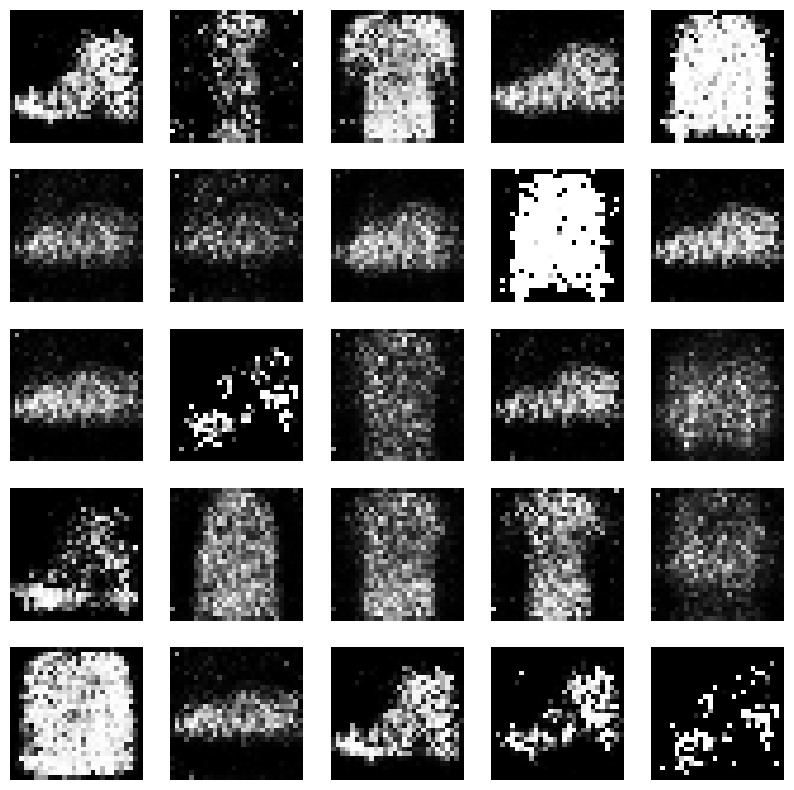

In [6]:
gif_frames, history = train(train_dataset, num_epochs, discriminator, generator, \
                            discriminator_optimizer, generator_optimizer)

Looking at what happened, we can see that the losses for G and D stay somewhat even over time. Neither side wins, and instead they appear to reach a stalemate. This is actually exactly what we want, as both networks can push the other to improve, and so our image generation improves over time.

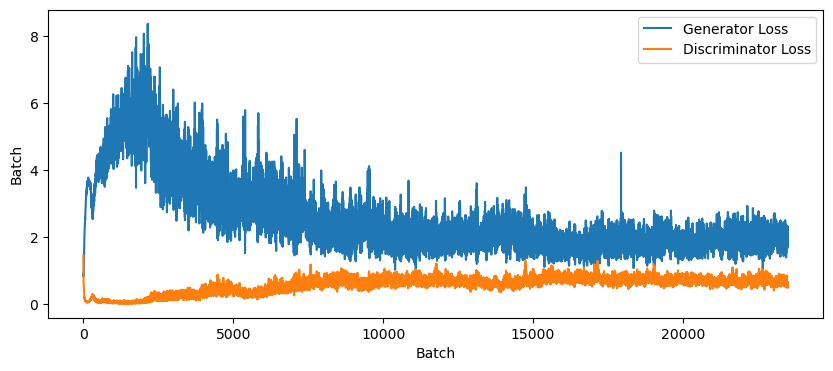

In [7]:
def plot_history(history):
    fig = plt.figure(figsize=(10, 4))
    plt.subplot(1, 1, 1)
    plt.plot(history['g_loss'], label="Generator Loss")
    plt.plot(history['d_loss'], label="Discriminator Loss")
    plt.xlabel('Batch')
    plt.ylabel('Batch')
    plt.legend()
plot_history(history)

The GIF helps show this improvement. We start off with noise, which becomes vague shapes/blobs, and finally starts to look like clothes. 

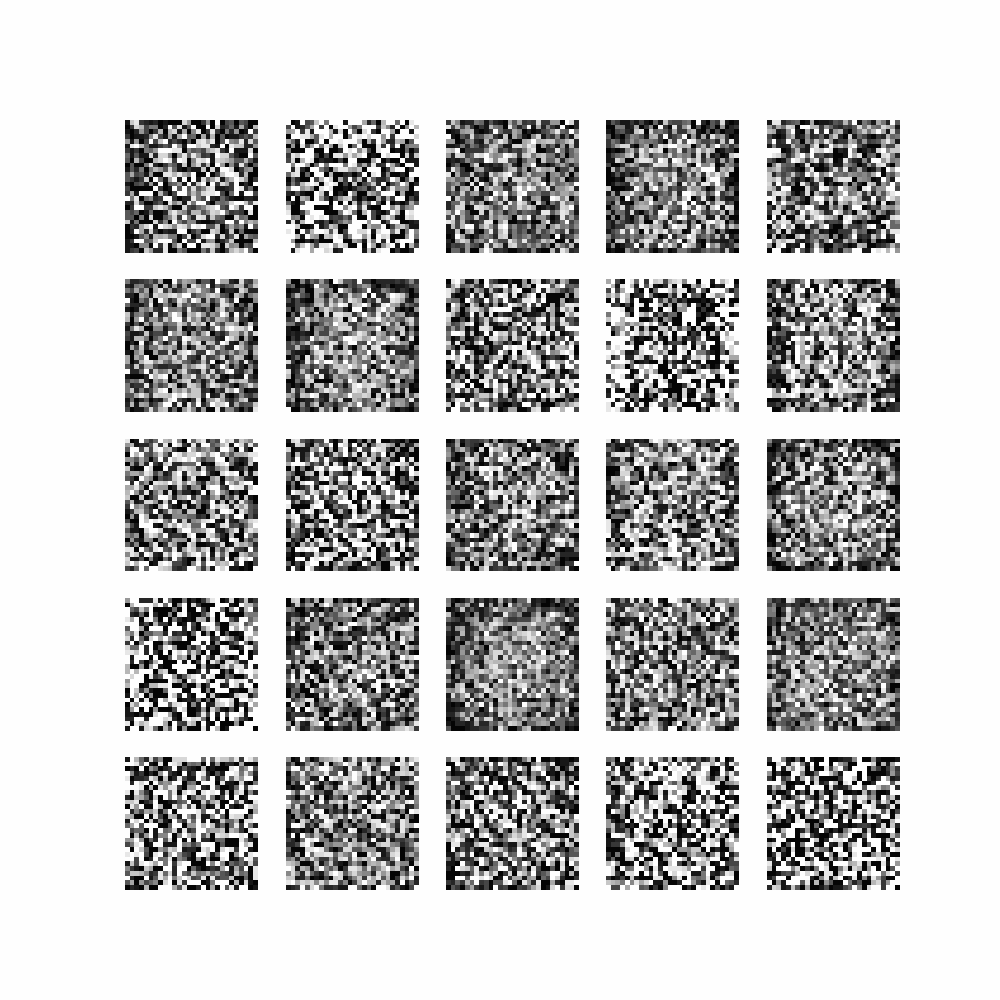

In [8]:
gif_frames[0].save("gan.gif", format="GIF", append_images=gif_frames, save_all=True, fps=2, loop=0)
display.Image('gan.gif')

## Deep Convolutional GAN

We started out with fully connected networks, but this is not the best way to deal with images. Moving to convolutions will give us a better way to capture spatial information, and ultimatley generate more stylish (i.e. realisitic) clothing. While we don't need to have both D and G being convolutional (we just leave D as a fully connected beast), we will switch to having convolutions in both.

In [9]:
def build_conv_generator(latent_dim = 100):

    # image input, this is still a 1D noise vector
    noise = keras.Input(shape=(latent_dim,), name='noise')
    # dense layer, the aim here is to go from our noise vector to some size that
    # we can reshape into an image-like representation. Here we're aiming for a 
    # size of 7x7x256, i.e. 1/4 the width and height of the final image, and 256
    # channels
    x = layers.Dense(7*7*256, use_bias=False, activation=None)(noise)
    # batch-norm and activation
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    # reshape into something image-like
    x = layers.Reshape((7, 7, 256))(x)

    # convolution layer.
    x = layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False, activation=None)(x)
    # batchnorm and activation
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # another convolutional layer, this time with the (2, 2) stride we'll do an upsample, moving to 14x14
    # feature maps
    x = layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation=None)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # final convolutional layer. Collapse from 64 channels down to 1, and upsample from 14x14 to 28x28
    # this is our output, note the tanh activation
    output = layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')(x)

    # return the model, noise as input, image as output
    return keras.Model(inputs=noise, outputs=output, name='conv_generator')

def build_conv_discriminator(input_shape = (28, 28, 1)):

    # image as input
    img = keras.Input(shape=input_shape, name='img')

    # standard DCNN really, though we're using the stride in the Conv2D to do our
    # downsampling
    x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', activation=None)(img)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', activation=None)(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    # output is a real/fake decision
    output = layers.Dense(1, activation=None)(x)

    # return the model. input is am image, output is a real/fake decision
    return keras.Model(inputs=img, outputs=output, name='conv_discriminator')

generator = build_conv_generator()
discriminator = build_conv_discriminator()

generator.summary()
discriminator.summary()

Model: "conv_generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ noise (InputLayer)              │ (None, 100)               │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_7 (Dense)                 │ (None, 12544)             │  1,254,400 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_3           │ (None, 12544)             │     50,176 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 12544)             │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ reshape_1 (Reshape)             │ (None, 7, 7, 256)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_transpose                │ (None, 7, 7, 128)         │    819,200 │
│ (Conv2DTranspose)               │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_4           │ (None, 7, 7, 128)         │        512 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 7, 7, 128)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_transpose_1              │ (None, 14, 14, 64)        │    204,800 │
│ (Conv2DTranspose)               │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_5           │ (None, 14, 14, 64)        │        256 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 14, 14, 64)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_transpose_2              │ (None, 28, 28, 1)         │      1,600 │
│ (Conv2DTranspose)               │                           │            │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 2,330,944 (8.89 MB)

 Trainable params: 2,305,472 (8.79 MB)

 Non-trainable params: 25,472 (99.50 KB)

Model: "conv_discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ img (InputLayer)                │ (None, 28, 28, 1)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d (Conv2D)                 │ (None, 14, 14, 64)        │      1,664 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 14, 14, 64)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout (Dropout)               │ (None, 14, 14, 64)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_1 (Conv2D)               │ (None, 7, 7, 128)         │    204,928 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 7, 7, 128)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_1 (Dropout)             │ (None, 7, 7, 128)         │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ flatten_1 (Flatten)             │ (None, 6272)              │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dense_8 (Dense)                 │ (None, 1)                 │      6,273 │
└─────────────────────────────────┴───────────────────────────┴────────────┘

 Total params: 212,865 (831.50 KB)

 Trainable params: 212,865 (831.50 KB)

 Non-trainable params: 0 (0.00 B)

We can now train our model, just by passing in the new G and D. We're re-creating the optimisers as well to ensure that any internal settings in those (like learning rate decay) are reset. Again, we could vary the optimisers between D and G, but we don't need to in this case at least.

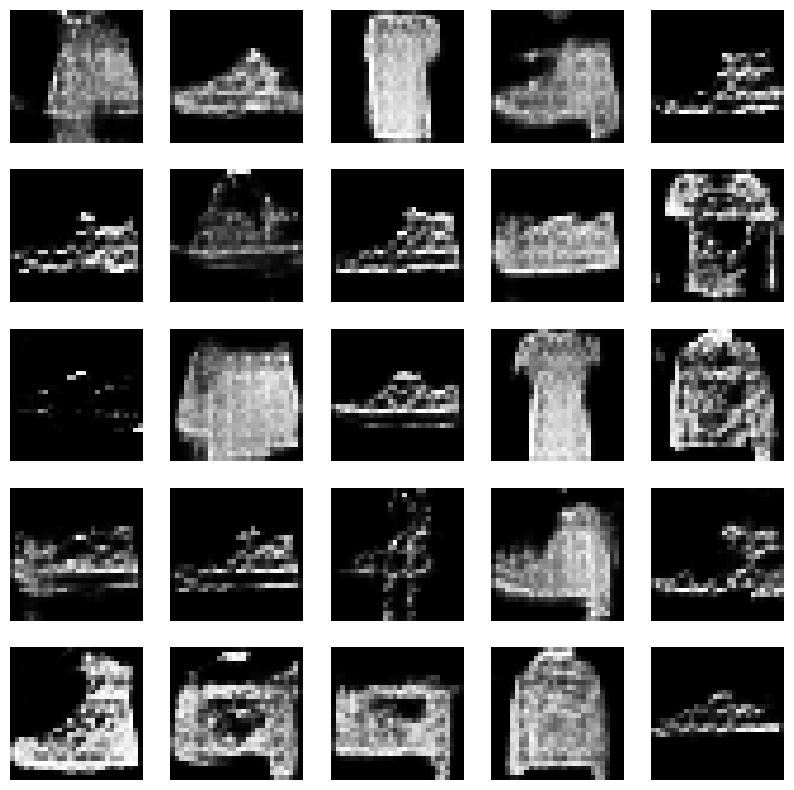

In [10]:
generator_optimizer = keras.optimizers.Adam(1e-4)
discriminator_optimizer = keras.optimizers.Adam(1e-4)

gif_frames, history = train(train_dataset, num_epochs, discriminator, generator, discriminator_optimizer, generator_optimizer)

We see training is fairly well balanced, and the end results look a little better than our dense version.

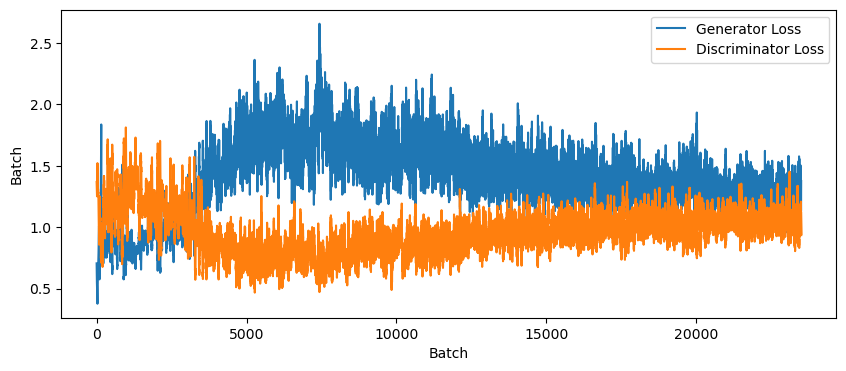

In [11]:
plot_history(history)

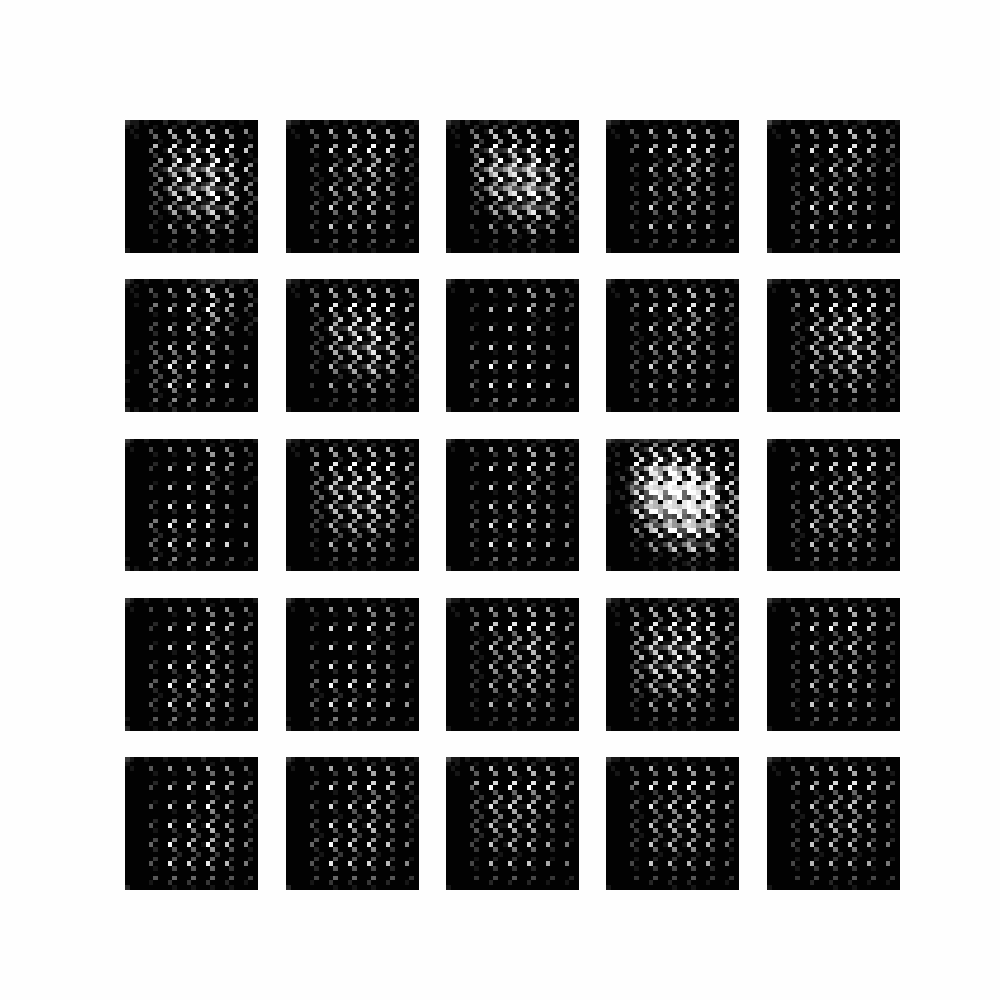

In [12]:
gif_frames[0].save("gan.gif", format="GIF", append_images=gif_frames, save_all=True, duration=10, loop=0)
display.Image('gan.gif')

### Mode Collapse?

If you run this a few times, in some instances you'll probably see a bit of mode collapse. This is a fairly common problem with GANs, and simply means that the GAN fails to generate very diverse samples, and instead ends up picking a few favourite modes that it just repeats over and over again. 

## Final Thoughts

We've made some clothes (sort of). Our networks probably haven't fully converged and could get a bit better, and as is often the case our network is not as fancy as it could be, but it does ok. As is usually the case in CAB420, we could add a lot more complexity to our networks and we'd see much fancier results. This demo doesn't go that far to try remain accessible, but if you're keen, go for it.

It's interesting to consider how these networks learn. The generator never actually sees a real image, all it gets is feedback from the discriminator as to whether what it has created is good or bad. Despite this, it manages to do a pretty good job of learning what a piece of clothing looks like.

The loss curve is interesting in that we can see that after a while we reach a kind-of steady state where neither side wins, rather they both push each other to improve. This is critical to a GANs success. If one half is overpowered (or learns too fast) the other can never catch up, and the entire system will fall over. This is why GANs can be a pain to train. Finding that balance is not always straight forward.